In [1]:
from pandas import DataFrame, Series
from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt

import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder # for one-hot encoding on categorical variable
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE, ADASYN,SMOTENC


## Overview of data

match
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
Name: match, dtype: object

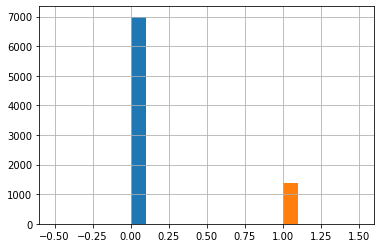

In [2]:
# read in the initial data
df_full = pd.read_csv('./Speed Dating Data.csv', encoding="ISO-8859-1") # use this encoding, funky error otherwise. thanks kagglers!
# show how Y is distributed at first
df_full.groupby("match").match.hist()

## Cleaning
* Select attributes and drop NaN

In [3]:
idnum = ['iid','pid']
attributes = ['gender', 'age', 'field_cd', 'race', 'imprace', 'imprelig', 'from', 'date', 'go_out', 'career_c', 'sports', 'tvsports', 'exercise', 'dining', 'museums', 'art', 'hiking', 'gaming', 'clubbing', 'reading', 'tv', 'theater', 'movies', 'concerts', 'music', 'shopping', 'yoga', 'attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1', 'shar1_1', 'attr3_1', 'sinc3_1', 'intel3_1', 'fun3_1', 'amb3_1']
#attributes = ['gender', 'age', 'undergra', 'field', 'field_cd', 'race', 'imprace', 'imprelig', 'zipcode','from', 'income', 'date', 'go_out', 'career', 'career_c', 'sports', 'tvsports', 'exercise', 'dining', 'museums', 'art', 'hiking', 'gaming', 'clubbing', 'reading', 'tv', 'theater', 'movies', 'concerts', 'music', 'shopping', 'yoga', 'attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1', 'attr3_1', 'sinc3_1', 'intel3_1', 'fun3_1']
#attitudes = ['goal', 'exphappy', 'expnum'] # expnum too much null
attitudes = ['goal','exphappy']
label = ['match']
date = df_full[label+idnum+attributes+attitudes]
date.head()
print(date.shape)
# After dropna()
date = date.dropna().drop_duplicates()
print(date.shape)

(8378, 43)
(8124, 43)


* Change scale of _attr3_1_ etc from 1-10 to percentage 

In [4]:
changeScale = date.copy()
needschange = [col for col in df_full.columns if '3_1' in col] # what you look for in the opposite sex
changeScale['sum_3'] = changeScale[needschange].sum(axis=1)
for i in range(len(needschange)):
    changeScale[needschange[i]] /= 0.01*changeScale['sum_3']
    
changeScale = changeScale.drop(columns=['sum_3'])
date = changeScale

## DATA MODEL 2: Concatenate two partners as a pair input

In [5]:
singleAttr = date.copy()
s1 = singleAttr[singleAttr.pid<singleAttr.iid].copy() # dupSingleAttr

s1.rename(columns={'iid' : 'pid', 'pid' : 'iid'}, inplace=True)

pairAttrs = singleAttr.merge(s1, on=['iid', 'pid'])  # merge two people as a feature pair
pairAttrs = pairAttrs.drop(columns=['match_y']).rename(columns={'match_x': 'match'})
temp = ['iid','pid','goal_x','goal_y','field_cd_x','field_cd_y','race_x','race_y','career_c_x','career_c_y']
pairAttrs[temp] = pairAttrs[temp].astype('int')
date2 = pairAttrs.copy()

In [6]:
date2.head()

,match,iid,pid,gender_x,age_x,field_cd_x,race_x,imprace_x,imprelig_x,from_x,...,fun1_1_y,amb1_1_y,shar1_1_y,attr3_1_y,sinc3_1_y,intel3_1_y,fun3_1_y,amb3_1_y,goal_y,exphappy_y
0,0,4,11,0,23.0,1,2,1.0,1.0,Texas,...,20.0,0.0,5.0,21.621622,24.324324,21.621622,18.918919,13.513514,1,7.0
1,0,4,12,0,23.0,1,2,1.0,1.0,Texas,...,40.0,0.0,0.0,19.565217,19.565217,21.739130,19.565217,19.565217,1,7.0
2,0,4,13,0,23.0,1,2,1.0,1.0,Texas,...,18.0,14.0,12.0,13.333333,23.333333,26.666667,26.666667,10.000000,2,3.0
3,1,4,14,0,23.0,1,2,1.0,1.0,Texas,...,40.0,5.0,5.0,20.000000,20.000000,20.000000,20.000000,20.000000,2,8.0
4,0,4,15,0,23.0,1,2,1.0,1.0,Texas,...,10.0,10.0,20.0,17.948718,17.948718,23.076923,17.948718,23.076923,1,5.0


In [7]:
USA = ['Texas', 'Bowdoin College', 'Southern California', 'Palm Springs, California', '94115', 
       'Cincinnati, Ohio', 'Miami', 'Georgia, USA', 'New York', 'california', 'Washington DC', 
       'New Jersey', 'Ann Arbor, MI', 'new york', 'Iowa',  'California', 'Westchester, NY',
       'Washington, DC', 'Boston', 'new jersey', 'Michigan', 'Brandeis University', 'Cincinnati, OH', 
       'Los Angeles', 'San Francisco(home)/Los Angeles(undergrad)', 'Philadelphia', 'Houston', 'Brooklyn',
       'Florida', 'Tuscaloosa, Alabama', 'Albuquerque, NM',
       'Palo Alto, California', 'Boston, MA', 'Torrance, CA',
       'St. Louis, MO', 'Minnesota', 'Chicago', 'Ohio',
       'Washington State', 'Arizona', 'Minneapolis, MN', 'NJ', 'NY',
       'San Francisco', 'Long Island', 'Brooklyn, NY', 'Colorado', 'Ann Arbor', 'Philippines',
       'Milwaukee, Wisconsin', 'brooklyn ny', 'Long Island, NY', 'Memphis, TN', 'Louisiana', 'Maryland',
       'Staten Island', 'New York, NY', 'Massachusetts', 'Connecticut',
       'Pougkeepsie NY', 'PA', 'Cherry Hill, NJ', 'Minneapolis', 'NYC', 'Philadelphia, PA',
       'Atlanta, GA', 'Cleveland', 'NYC (Staten Island)','North Carolina', 'State College, PA', 'Detroit',
       'Washington DC Metro Region', 'colorado', 'Berkeley, CA',
       'Buffalo, NY', 'Pennsylvania', 'San Diego, CA',
       'Nebraska', 'Queens', 'Kansas', 'nyc', 'Atlanta', 'Los Angeles, CA', 'new york city',
       'Rochester, NY', 'Berkeley','Northern California', 'Silver Spring, MD', 'Vestal',
       'Texas & Boston', 'Cameroon', 'Bulgaria', 'New York City',
       'New York Area/ New Jersey', 'Baltimore', 'DC',
       'Germany', 'Wash DC (4 yrs)', 'Pittsburgh',
       'Detroit, Michigan, USA', 'J.P. Morgan', 'Virginia', 'Indiana',
       'lOS aNGELES', 'Wisconsin', 'Born in Montana, raised in South Jersey (nr. Philadelphia)',
       'Portland, Oregon', 'Seattle', 'Lexington, MA',
       'brooklyn, ny', 'Boulder, Colorado', 'Northern Virginia', 'I am from NYC',
       'Malaysia, then Massachusetts', 'Katonah, NY (more recently, Boston)',
       'Washington, D.C.','New Hope, PA', 'boston, ma', 'Las Vegas, Nevada',
       'UNCC', 'Northern New Jersey', 'NYC-6 yrs. Grew up in Nebraska',
       'France  / New York', 'Erie, PA', 'Westchester, new York',
       'USA/American', 'Great Neck, NY', 'California (West Coast)',
       'Portland, OR', 'New York/South Korea/Japan', 'Dallas, Texas', 'Palo Alto, CA',
       'WASHINGTON, D.C.', 'CALIFORNIA', 'Manhattan', 'atlanta, ga',
       'California and New York', 'Bronx Science', 'nashville, TN',
       'Midwest USA', 'los angeles','NYC, San Francisco', 'Oregon', 'San Francisco, CA',
       'Florida and Virginia', 'San Francisco Bay Area',
       'Hawaii and Los Angeles', 'Austin, TX', 'TN', 'Pittsburgh, PA', 'Hastings-on-Hudson, NY',
       'Burlington, Vermont', 'Santa Barbara, California',
       'Texas/London', 'CT, FL, TN', 'Detroit suburbs',
       'south carolina', 'California, New Jersey', 'alabama',
       'Westchester County, N.Y.', 'South Orange, New Jersey',
       'Boston, Ma', 'Kansas City, Missouri', 'Upstate New York', 'San Diego',
       'Hawaii', 'Salt Lake City', 'Saratoga, NY',
       'San Francisco/LA', 'India and NJ', 'London & New York']

pairAttrs['from_x'] = (pairAttrs['from_x'].isin(USA)).astype(int)
pairAttrs['from_y'] = (pairAttrs['from_y'].isin(USA)).astype(int)

pairAttrs = pd.concat([pairAttrs,pd.get_dummies(pairAttrs['field_cd_x'], prefix='field_cd_x')],axis=1)
pairAttrs.drop(['field_cd_x'],axis=1, inplace=True)

pairAttrs = pd.concat([pairAttrs,pd.get_dummies(pairAttrs['field_cd_y'], prefix='field_cd_y')],axis=1)
pairAttrs.drop(['field_cd_y'],axis=1, inplace=True)

pairAttrs = pd.concat([pairAttrs,pd.get_dummies(pairAttrs['race_x'], prefix='race_x')],axis=1)
pairAttrs.drop(['race_x'],axis=1, inplace=True)

pairAttrs = pd.concat([pairAttrs,pd.get_dummies(pairAttrs['race_y'], prefix='race_y')],axis=1)
pairAttrs.drop(['race_y'],axis=1, inplace=True)

pairAttrs = pd.concat([pairAttrs,pd.get_dummies(pairAttrs['career_c_x'], prefix='career_c_x')],axis=1)
pairAttrs.drop(['career_c_x'],axis=1, inplace=True)

pairAttrs = pd.concat([pairAttrs,pd.get_dummies(pairAttrs['career_c_y'], prefix='career_c_y')],axis=1)
pairAttrs.drop(['career_c_y'],axis=1, inplace=True)

pairAttrs = pd.concat([pairAttrs,pd.get_dummies(pairAttrs['goal_x'], prefix='goal_x')],axis=1)
pairAttrs.drop(['goal_x'],axis=1, inplace=True)

pairAttrs = pd.concat([pairAttrs,pd.get_dummies(pairAttrs['goal_y'], prefix='goal_y')],axis=1)
pairAttrs.drop(['goal_y'],axis=1, inplace=True)

pairAttrs = pairAttrs.drop('iid', 1)
pairAttrs = pairAttrs.drop('pid', 1)
pairAttrs = pairAttrs.drop('gender_x', 1)
pairAttrs = pairAttrs.drop('gender_y', 1)

In [8]:
# pairAttrs.columns.values

### imbalanced-learn: SMOTENC

In [9]:
cols = list(pairAttrs.columns.values)
categ = np.array([col.endswith(tuple(map(str,range(0,10)))) for col in cols])
yn = list(np.where(categ==True)[0]-1)  # find the indices of categorical features(cols) in X_train
smote_nc = SMOTENC(categorical_features=yn, random_state=123)

pairXs = pairAttrs.copy()
pairXs = pairXs.drop('match', 1)

X = pairXs.values
y = pairAttrs['match'].values

X, y = smote_nc.fit_resample(X, y)

In [10]:
# DataFrame(X)

(array([3296.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
        3296.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

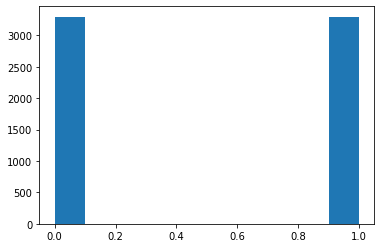

In [11]:
# show how y distributed now
plt.hist(y)

### Split data set

In [12]:
X_temp, X_test, y_temp, y_test = \
        train_test_split(X, y, test_size=0.2, 
                         shuffle=True, random_state=123, stratify=y)
X_train, X_valid, y_train, y_valid = \
        train_test_split(X_temp, y_temp, test_size=0.2,
                         shuffle=True, random_state=123, stratify=y_temp)
print('Train size', X_train.shape, 'class proportions', np.bincount(y_train))
print('Valid size', X_valid.shape, 'class proportions', np.bincount(y_valid))
print('Test size', X_test.shape, 'class proportions', np.bincount(y_test))



Train size (4218, 154) class proportions [2109 2109]
Valid size (1055, 154) class proportions [527 528]
Test size (1319, 154) class proportions [660 659]


### Logistic Regression 

**Partial code from professor’s demo**

In [13]:
# Using feature selection first -- Forward Sequential Search
# check how many number of features to select that give the best score
pipe = make_pipeline(StandardScaler(),
                     LogisticRegression(solver='newton-cg'))

# Feature selection
from mlxtend.feature_selection import SequentialFeatureSelector as SFS


sfs1 = SFS(pipe, 
           k_features=44, 
           forward=True, 
           floating=False, 
           verbose=2,
           scoring='accuracy',
           cv=10,
           n_jobs=-1)
sfs1 = sfs1.fit(X_train, y_train)



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 139 out of 154 | elapsed:    2.4s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 154 out of 154 | elapsed:    2.5s finished

[2019-12-18 09:00:50] Features: 1/44 -- score: 0.5820349877857954[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 138 out of 153 | elapsed:    2.0s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 153 out of 153 | elapsed:    2.2s finished

[2019-12-18 09:00:52] Features: 2/44 -- score: 0.6074056354200673[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 152 out of 152 | elapsed:    2.5s finished

[2019-12-18 09:00:55] Features: 3/44 -- score: 0.6088285621010684[Parallel(n_j

[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 125 out of 125 | elapsed:    9.5s finished

[2019-12-18 09:03:49] Features: 30/44 -- score: 0.7003275883419077[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 124 out of 124 | elapsed:    9.9s finished

[2019-12-18 09:03:59] Features: 31/44 -- score: 0.7036468124866319[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 123 out of 123 | elapsed:    9.4s finished

[2019-12-18 09:04:09] Features: 32/44 -- score: 0.7105244790669925[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 122 out of 122 | elapsed:    9.6s finished

[2019-12-18 09:04:18] Features: 33/44 

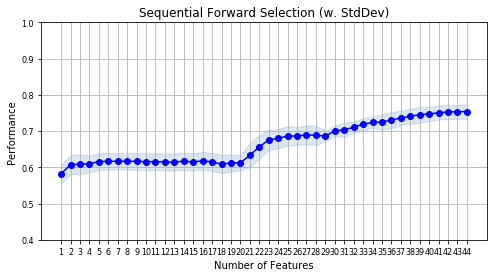

In [14]:

from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
fig1 = plot_sfs(sfs1.get_metric_dict(), kind='std_dev',figsize=(8,4))

plt.ylim([0.4, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.tick_params(axis='both',which='major',labelsize=8)
plt.grid()
plt.show()




In [15]:
# Use the selected features from SFS:
pipe = make_pipeline(StandardScaler(),
                     LogisticRegression(solver='newton-cg'))
X_selected_1 = X_train[:,sfs1.k_feature_idx_].copy()
pipe.fit(X_selected_1, y_train)
X_select_val_1 = X_valid[:,sfs1.k_feature_idx_].copy()
X_select_test_1 = X_test[:,sfs1.k_feature_idx_].copy()
print('Training Accuracy %.2f%%' % (100*pipe.score(X_selected_1, y_train)))
print('Validation Accuracy %.2f%%' % (100*pipe.score(X_select_val_1, y_valid)))
print('Test Accuracy %.2f%%' % (100*pipe.score(X_select_test_1, y_test)))
lr_model = pipe.named_steps.logisticregression
lr_model.coef_

Training Accuracy 75.44%
Validation Accuracy 74.31%
Test Accuracy 74.53%


array([[-0.01287403,  0.17278396, -0.0886466 ,  0.00129171, -0.2368657 ,
        -0.16701574,  0.15699981, -0.1695806 ,  0.04599065, -0.19564149,
        -0.17390656, -0.24550153, -0.10443852,  0.0118584 , -0.34298278,
         0.12214371,  0.02311065, -0.0724323 , -0.03852823, -0.19451193,
         0.0203112 , -0.04658022,  0.00311414, -0.87361008, -0.59149221,
        -0.93307443, -0.46465314, -0.10762538, -0.2991609 , -0.23506434,
        -0.35035506, -0.46521706, -0.30464944, -0.20873802, -0.59002001,
        -0.05813543, -0.02924346, -0.17751302,  0.07647654, -0.27870999,
        -0.31511516,  0.06153348, -0.01966537, -0.04658022]])

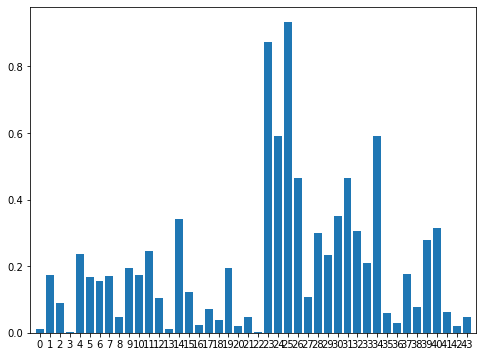

In [16]:
# # plot the predictors
fig, ax = plt.subplots(figsize=(8,6))
coefs = np.sum(np.abs(lr_model.coef_), axis=0)

ax.bar(range(X_selected_1.shape[1]), coefs)
ax.set_xlim([-1, X_selected_1.shape[1]])
ax.set_xticks(range(X_selected_1.shape[1]))

plt.show()

In [17]:
# 10 Critical features of LR
crit_coef = sorted(coefs,reverse=True)[0:10]
crit_idx_lr = [list(coefs).index(crit_coef[i]) for i in range(len(crit_coef))]
pairAttrs.iloc[:,crit_idx_lr]

,sinc1_1_x,yoga_x,attr1_1_x,amb3_1_x,sinc3_1_x,intel1_1_x,attr3_1_x,gaming_x,date_y,intel3_1_x
0,20.0,8.0,20.0,20.512821,20.512821,20.0,17.948718,5.0,5.0,17.948718
1,20.0,8.0,20.0,20.512821,20.512821,20.0,17.948718,5.0,1.0,17.948718
2,20.0,8.0,20.0,20.512821,20.512821,20.0,17.948718,5.0,7.0,17.948718
3,20.0,8.0,20.0,20.512821,20.512821,20.0,17.948718,5.0,4.0,17.948718
4,20.0,8.0,20.0,20.512821,20.512821,20.0,17.948718,5.0,4.0,17.948718
...,...,...,...,...,...,...,...,...,...,...
3938,20.0,3.0,20.0,18.918919,24.324324,10.0,8.108108,7.0,6.0,24.324324
3939,20.0,3.0,20.0,18.918919,24.324324,10.0,8.108108,7.0,7.0,24.324324
3940,20.0,3.0,20.0,18.918919,24.324324,10.0,8.108108,7.0,4.0,24.324324
3941,20.0,3.0,20.0,18.918919,24.324324,10.0,8.108108,7.0,6.0,24.324324


### Random Forest

In [18]:
# Load scikit's random forest classifier library
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

random_classifier = RandomForestClassifier()

parameters = { 'max_features':np.arange(35,45),'n_estimators':[100],'min_samples_leaf': [5,10,15,20,25]}

rf = GridSearchCV(random_classifier, parameters, cv = 5, error_score=0,
                    n_jobs=-1, verbose = 10)

# rf = RandomForestClassifier(n_jobs=500)
rf.fit(X_temp, y_temp)
p_train = rf.score(X_temp, y_temp)
p_test = rf.score(X_test, y_test)
print('Transf. training accuracy: %.2f%%' % (p_train * 100))
print('Transf. test accuracy: %.2f%%' % (p_test * 100))
print(rf.best_params_)


Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   14.9s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:   21.7s
[Parallel(n_jobs=-1)]: Done  69 tasks      | elapsed:   27.6s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:   32.9s
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:   38.6s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:   44.9s
[Parallel(n_jobs=-1)]: Done 129 tasks      | elapsed:   52.6s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   59.3s
[Parallel(n_jobs=-1)]: Done 165 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  1

Transf. training accuracy: 98.03%
Transf. test accuracy: 92.65%
{'max_features': 37, 'min_samples_leaf': 5, 'n_estimators': 100}


In [20]:
# Extract single tree
modelrf = RandomForestClassifier(max_features=43, min_samples_leaf= 5, n_estimators= 100)
modelrf.fit(X_train, y_train)
estimator = modelrf.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = pairAttrs.iloc[:, 1:].columns,
                class_names = str(pairAttrs['match']),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# # Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

In [19]:
# # Load scikit's random forest classifier library
# first only tuning max_feature to find an approximate range
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import GridSearchCV

random_classifier = RandomForestClassifier(random_state=0)

parameters = { 'max_features':np.arange(1,150),'n_estimators':[200],'min_samples_leaf': [5], "ccp_alpha":[0.001]}

rf = GridSearchCV(random_classifier, parameters, cv = 5, error_score=0,
                    n_jobs=-1, verbose = 10)

# rf = RandomForestClassifier(n_jobs=500)
rf.fit(X_temp, y_temp)
p_train = rf.score(X_temp, y_temp)
p_test = rf.score(X_test, y_test)
print('Transf. training accuracy: %.2f%%' % (p_train * 100))
print('Transf. test accuracy: %.2f%%' % (p_test * 100))
print(rf.best_params_)
print(rf.best_score_)

Fitting 5 folds for each of 149 candidates, totalling 745 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:   11.0s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:   15.2s
[Parallel(n_jobs=-1)]: Done  69 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:   27.4s
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:   35.8s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:   44.3s
[Parallel(n_jobs=-1)]: Done 129 tasks      | elapsed:   56.7s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 165 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  1

Transf. training accuracy: 95.62%
Transf. test accuracy: 91.13%
{'ccp_alpha': 0.001, 'max_features': 41, 'min_samples_leaf': 5, 'n_estimators': 200}
0.9047970718634495


In [20]:
# tuning again with a smaller range of max_features
random_classifier = RandomForestClassifier(random_state=0)

parameters = { 'max_features':np.arange(90,110),'n_estimators':[100, 200],'min_samples_leaf': [0.5, 1, 5], "ccp_alpha":[0.001, 0.0005]}

rf = GridSearchCV(random_classifier, parameters, cv = 5, error_score=0,
                    n_jobs=-1, verbose = 10)

# rf = RandomForestClassifier(n_jobs=500)
rf.fit(X_temp, y_temp)
p_train = rf.score(X_temp, y_temp)
p_test = rf.score(X_test, y_test)
print('Transf. training accuracy: %.2f%%' % (p_train * 100))
print('Transf. test accuracy: %.2f%%' % (p_test * 100))
print(rf.best_params_)
print(rf.best_score_)

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   26.7s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   29.3s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:   45.2s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:   59.8s
[Parallel(n_jobs=-1)]: Done  69 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 129 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 165 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  3

Transf. training accuracy: 98.99%
Transf. test accuracy: 92.12%
{'ccp_alpha': 0.0005, 'max_features': 106, 'min_samples_leaf': 1, 'n_estimators': 200}
0.9142764642931015


**The result is slightly different from that in our report, that's because when we re-organize our code, random state is used but for the paper result it wasn't.**

**ROC Curve**

Transf. training accuracy: 98.81%
Transf. test accuracy: 92.12%
Recall Baseline: 1.0 Test: 0.88 Train: 0.98
Precision Baseline: 0.5 Test: 0.96 Train: 1.0
Roc Baseline: 0.5 Test: 0.97 Train: 1.0


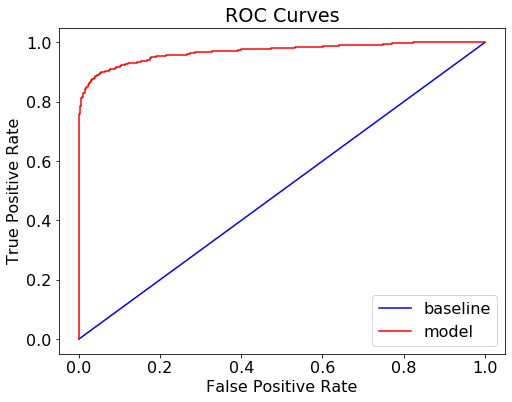

<Figure size 432x288 with 0 Axes>

In [24]:
modelrf = RandomForestClassifier(max_features=90, min_samples_leaf= 1, n_estimators=200, random_state=0, ccp_alpha=0.0005)
modelrf.fit(X_temp, y_temp)
p_train = modelrf.score(X_temp, y_temp)
p_test = modelrf.score(X_test, y_test)
print('Transf. training accuracy: %.2f%%' % (p_train * 100))
print('Transf. test accuracy: %.2f%%' % (p_test * 100))

# Training predictions
train_rf_pred = modelrf.predict(X_temp)
train_rf_probs = modelrf.predict_proba(X_temp)[:, 1]

# Testing predictions
rf_pred = modelrf.predict(X_test)
rf_probs = modelrf.predict_proba(X_test)[:, 1]

from sklearn.metrics import precision_score, recall_score, roc_auc_score, roc_curve

def evaluate_model(predictions, probs, train_predictions, train_probs):
    """Compare machine learning model to baseline performance.
    Computes statistics and shows ROC curve."""
    
    baseline = {}
    
    baseline['recall'] = recall_score(y_test, 
                                     [1 for _ in range(len(y_test))])
    baseline['precision'] = precision_score(y_test, 
                                      [1 for _ in range(len(y_test))])
    baseline['roc'] = 0.5
    
    results = {}
    
    results['recall'] = recall_score(y_test, predictions)
    results['precision'] = precision_score(y_test, predictions)
    results['roc'] = roc_auc_score(y_test, probs)
    
    train_results = {}
    train_results['recall'] = recall_score(y_temp, train_predictions)
    train_results['precision'] = precision_score(y_temp, train_predictions)
    train_results['roc'] = roc_auc_score(y_temp, train_probs)
    
    for metric in ['recall', 'precision', 'roc']:
        print(f'{metric.capitalize()} Baseline: {round(baseline[metric], 2)} Test: {round(results[metric], 2)} Train: {round(train_results[metric], 2)}')
    
    # Calculate false positive rates and true positive rates
    base_fpr, base_tpr, _ = roc_curve(y_test, [1 for _ in range(len(y_test))])
    model_fpr, model_tpr, _ = roc_curve(y_test, probs)

    plt.figure(figsize = (8, 6))
    plt.rcParams['font.size'] = 16
    
    # Plot both curves
    plt.plot(base_fpr, base_tpr, 'b', label = 'baseline')
    plt.plot(model_fpr, model_tpr, 'r', label = 'model')
    plt.legend();
    plt.xlabel('False Positive Rate'); 
    plt.ylabel('True Positive Rate'); plt.title('ROC Curves');
    plt.show();

evaluate_model(rf_pred, rf_probs, train_rf_pred, train_rf_probs)
plt.savefig('roc_auc_curve.png')

### XGBoost

In [12]:
import xgboost as xgb

In [26]:
# d_train= xgb.DMatrix(data=X_train,label=y_train)
# d_test= xgb.DMatrix(data=X_test)

In [15]:
xg = xgb.XGBClassifier(objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, reg_lambda=0.15, alpha=0, n_estimators = 100)
xg.fit(X_train,y_train)
print('xgboost train score: %.2f%%' % (xg.score(X_train,y_train)*100))
predictions = xg.predict(X_test)
print('xgboost test score: %.2f%%' % (xg.score(X_test, y_test)*100))

xgboost train score: 96.30%
xgboost test score: 92.19%


In [29]:
xgbclf = xgb.XGBClassifier(colsample_bytree = 0.3, seed=123)
parameters = {
    'objective':['binary:logistic', 'binary:hinge'],
    'max_depth': range (4,8,1),
    'n_estimators': [50,100,200],
    'learning_rate': [0.1, 0.01],
    'reg_lambda': [0.5,0.1],
    'alpha': [1,5]
}
grid_search = GridSearchCV(
    estimator=xgbclf,
    param_grid=parameters,
    scoring = 'roc_auc',
    n_jobs = -1,
    cv = 5
)
grid_search.fit(X_temp, y_temp)
grid_search.best_estimator_

XGBClassifier(alpha=1, base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.3, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=7,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1, seed=123,
              silent=None, subsample=1, verbosity=1)

In [30]:
p_train = grid_search.score(X_temp, y_temp)
p_test = grid_search.score(X_test, y_test)
print('Transf. training accuracy: %.2f%%' % (p_train * 100))
print('Transf. test accuracy: %.2f%%' % (p_test * 100))

Transf. training accuracy: 100.00%
Transf. test accuracy: 96.54%


In [24]:
params = {'objective':'binary:logistic','colsample_bytree': 0.3,'learning_rate': 0.1,
                'max_depth': 7, 'alpha': 1}

cv_results = xgb.cv(dtrain=data_dmatrix, params=params, nfold=5,
                    num_boost_round=50,early_stopping_rounds=10,metrics="rmse", as_pandas=True, seed=123)

In [25]:
cv_results

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
0,0.707100,0.003062,0.707000,0.012278
1,0.707100,0.003062,0.707000,0.012278
2,0.707100,0.003062,0.707000,0.012278
3,0.707100,0.003062,0.707000,0.012278
4,0.707100,0.003062,0.707000,0.012278
5,0.707100,0.003062,0.707000,0.012278
6,0.707100,0.003062,0.707000,0.012278
7,0.706301,0.003562,0.706505,0.011792
8,0.702087,0.004488,0.705499,0.011731
9,0.693622,0.006361,0.698386,0.012877


### SVM

In [ ]:
from sklearn import svm
from sklearn.svm import SVC

**GridSearchCV: Model Selection**

In [14]:
from sklearn.model_selection import GridSearchCV
clf = svm.SVC(gamma='auto',probability=False)
parameters = {'kernel':('linear', 'rbf'), 'C':[0.5, 1]}
gs_svm = GridSearchCV(clf, parameters, cv = 5, error_score=0,
                    n_jobs=-1, verbose = 10)

# apply to data without normalization
gs_svm.fit(X_temp, y_temp)

print(gs_svm.best_estimator_)
gs_svm_acc_train1 = gs_svm.score(X_temp, y_temp)
gs_svm_acc_test1 = gs_svm.score(X_test, y_test)
# svm_clf.predict(X_test)
print('Training accuracy: %.2f%%' % (gs_svm_acc_train1 * 100))
print('Test accuracy: %.2f%%' % (gs_svm_acc_test1 * 100))

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done   8 out of  20 | elapsed:   29.5s remaining:   44.2s
[Parallel(n_jobs=-1)]: Done  11 out of  20 | elapsed:   35.5s remaining:   29.0s
[Parallel(n_jobs=-1)]: Done  14 out of  20 | elapsed:   40.9s remaining:   17.5s
[Parallel(n_jobs=-1)]: Done  17 out of  20 | elapsed:  1.4min remaining:   14.3s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  1.9min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  1.9min finished


Training accuracy: 99.94%
Test accuracy: 97.12%


In [28]:
# apply to normalized data (worse!)

clf = svm.SVC(probability=True)
parameters = {'kernel':('linear', 'rbf'), 'C':[0.5, 1]}
gs_svm = GridSearchCV(clf, parameters, cv = 5, error_score=0,
                    n_jobs=-1, verbose = 10)

gs_svm.fit(X_temp_scl, y_temp)  
gs_svm_acc_train2 = gs_svm.score(X_temp_scl, y_temp)
gs_svm_acc_test2 = gs_svm.score(X_test_scl, y_test)
# svm_clf.predict(X_test)
print('Training accuracy: %.2f%%' % (gs_svm_acc_train2 * 100))
print('Test accuracy: %.2f%%' % (gs_svm_acc_test2 * 100))

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   18.8s
[Parallel(n_jobs=-1)]: Done   8 out of  20 | elapsed:   28.7s remaining:   43.0s
[Parallel(n_jobs=-1)]: Done  11 out of  20 | elapsed:   43.6s remaining:   35.7s
[Parallel(n_jobs=-1)]: Done  14 out of  20 | elapsed:   49.8s remaining:   21.3s
[Parallel(n_jobs=-1)]: Done  17 out of  20 | elapsed:   51.8s remaining:    9.1s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  1.0min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  1.0min finished
/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


Training accuracy: 94.35%
Test accuracy: 92.27%
